In [1]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot')
import pandas as pd

import lsst.ip.diffim as ipDiffim

In [2]:
import diffimTests as dit
#reload(dit)

testObj = dit.DiffimTest(varFlux2=np.repeat(5000, 10),
                         n_sources=1000, verbose=True, sourceFluxRange=(2000., 60000.), 
                         psf_yvary_factor=0.5, psfSize=13)
res = testObj.runTest(spatialKernelOrder=2)
print res

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
PSF y spatial-variation: -0.496242902547 0.496864203708
Variable source: 11 430.532014184 434.414017796 0 5000
Variable source: 2 427.660810318 419.100929438 0 5000
Variable source: 4 358.467452217 410.92744144 0 5000
Variable source: 8 316.562712626 116.894212295 0 5000
Variable source: 13 403.10653814 219.668213309 0 5000
Variable source: 1 387.709867276 181.352731522 0 5000
Variable source: 0 127.628652422 282.460928881 0 5000
Variable source: 6 343.291765499 352.648316392 0 5000
Variable source: 5 171.4583324 209.804682288 0 5000
Variable source: 3 193.456129542 274.216491496 0 5000
{'ZOGY': {'FP': 45, 'FN': 1, 'TP': 9}, 'ALstack': {'FP': 4, 'FN': 1, 'TP': 9}, 'SZOGY': {'FP': 2, 'FN': 1, 'TP': 9}, 'ALstack_decorr': {'FP': 0, 'FN': 1, 'TP': 9}}


In [3]:
exposure = testObj.im2.asAfwExposure()
template = testObj.im1.asAfwExposure()

A&L(dec): stats(mean=0.11784811, stdev=24.91094, min=-155.32483, max=283.40393)
ZOGY: stats(mean=-0.02047516321259427, stdev=25.403586555555631, min=-491.72903414613097, max=593.89464369892278)
A&L(dec) - ZOGY: stats(mean=0.028431609776855452, stdev=2.8342845773646999, min=-288.34261345256147, max=452.37151083505603)
A&L(dec) - A&L: stats(mean=-0.037173215, stdev=6.9035301, min=-41.893799, max=53.25531)


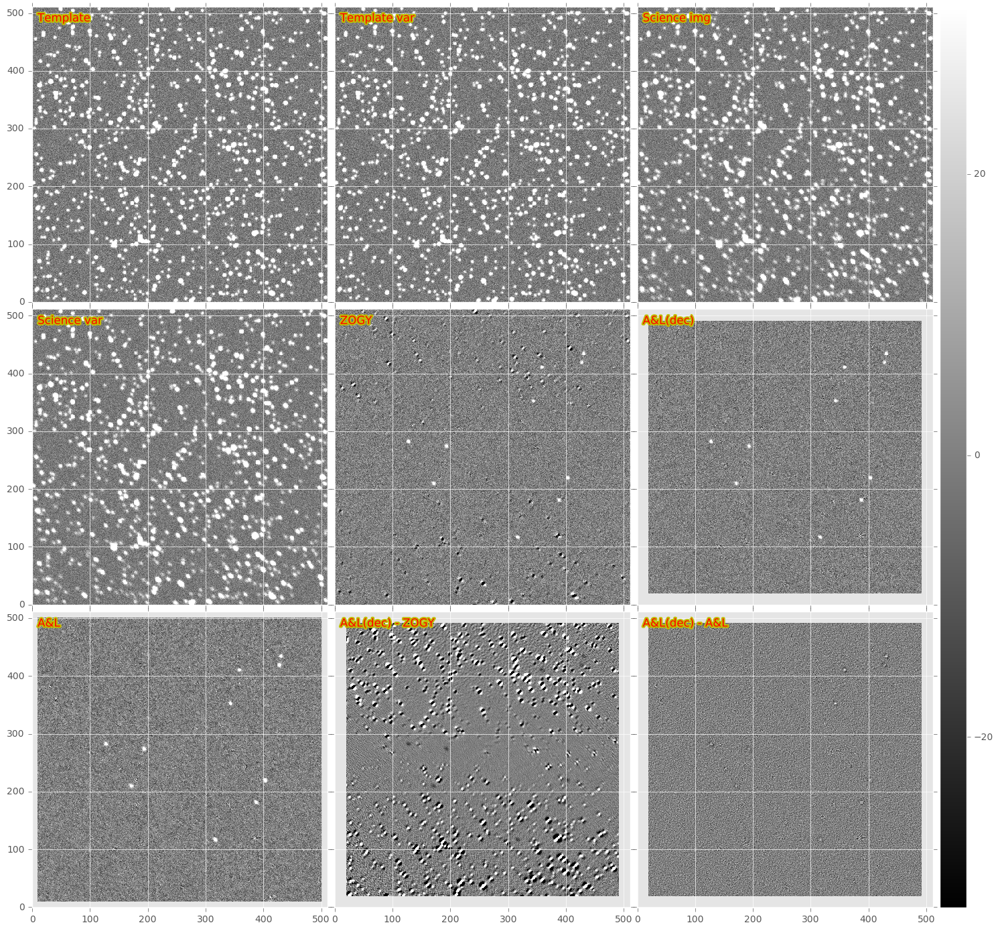

In [4]:
#dit.plotImageGrid((testObj.im1.im, testObj.im2.im), imScale=8)
testObj.doPlot(imScale=6);

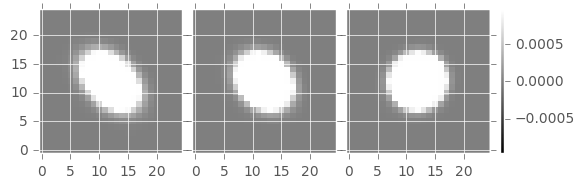

In [5]:
dit.plotImageGrid((testObj.variablePsf.getImage(20., 20.), 
                   testObj.variablePsf.getImage(250., 250.),
                   testObj.variablePsf.getImage(500., 500.)))

OK, let's try a spatially-varying ZOGY! But without correctly setting the (spatially varying) PSF of the diffim.

In [6]:
import lsst.pex.config as pexConfig
import lsst.afw.image as afwImage
import lsst.afw.geom as afwGeom
import lsst.pipe.base as pipeBase

class ZogyMapperSubtask(ipDiffim.ImageMapperSubtask):
    ConfigClass = ipDiffim.ImageMapperSubtaskConfig
    _DefaultName = 'ip_diffim_ZogyMapperSubtask'
    
    def __init__(self, *args, **kwargs):
        ipDiffim.ImageMapperSubtask.__init__(self, *args, **kwargs)
        
    def run(self, subExp, expandedSubExp, fullBBox, **kwargs):
        bbox = subExp.getBBox()
        center = ((bbox.getBeginX() + bbox.getEndX()) // 2., (bbox.getBeginY() + bbox.getEndY()) // 2.)
        center = afwGeom.Point2D(center[0], center[1])
        
        variablePsf2 = kwargs.get('variablePsf', None)
        sigmas = kwargs.get('sigmas', None)
        inImageSpace = kwargs.get('inImageSpace', False)
                
        # Psf and image for science img (index 2)
        subExp2 = subExp
        if variablePsf2 is None:
            psf2 = subExp.getPsf().computeImage(center).getArray()
        else:
            psf2 = variablePsf2.getImage(center.getX(), center.getY())
        psf2_orig = psf2
        subim2 = expandedSubExp.getMaskedImage()
        subarr2 = subim2.getImage().getArray()
        subvar2 = subim2.getVariance().getArray()
        if sigmas is None:
            sig2 = np.sqrt(dit.computeClippedImageStats(subvar2).mean)
        else:
            sig2 = sigmas[1]  # for testing, can use the input sigma (global value for entire exposure)
        
        # Psf and image for template img (index 1)
        template = kwargs.get('template')
        subExp1 = afwImage.ExposureF(template, expandedSubExp.getBBox())
        psf1 = template.getPsf().computeImage(center).getArray()
        psf1_orig = psf1
        subim1 = subExp1.getMaskedImage()
        subarr1 = subim1.getImage().getArray()
        subvar1 = subim1.getVariance().getArray()
        if sigmas is None:
            sig1 = np.sqrt(dit.computeClippedImageStats(subvar1).mean)
        else:
            sig1 = sigmas[0]
        
        #shape2 = subExp2.getPsf().computeShape(afwGeom.Point2D(center[0], center[1]))
        #shape1 = subExp1.getPsf().computeShape(afwGeom.Point2D(center[0], center[1]))
        #print shape2, shape1
        
        psf1b = psf1; psf2b = psf2
        if psf1.shape[0] == 41:   # it's a measured psf (hack!) Note this really helps for measured psfs.
            psf1b = psf1.copy()
            psf1b[psf1b < 0] = 0
            #psf1b[0:10,0:10] = psf1b[31:41,31:41] = 0
            psf1b[0:10,:] = psf1b[:,0:10] = psf1b[31:41,:] = psf1b[:,31:41] = 0
            psf1b /= psf1b.sum()

            psf2b = psf2.copy()
            psf2b[psf2b < 0] = 0
            psf2b[0:10,:] = psf2b[:,0:10] = psf2b[31:41,:] = psf2b[:,31:41] = 0
            psf2b /= psf2b.sum()

        # from diffimTests.diffimTests ...
        if subarr1.shape[0] < psf1.shape[0] or subarr1.shape[1] < psf1.shape[1]:
            return pipeBase.Struct(subExposure=subExp)

        D_zogy, var_zogy = None, None
        if not inImageSpace:
            padSize0 = subarr1.shape[0]//2 - psf1.shape[0]//2
            padSize1 = subarr1.shape[1]//2 - psf1.shape[1]//2
            # Hastily assume the image is even-sized and the psf is odd... and that the two images
            #   and psfs have the same dimensions!
            psf1 = np.pad(psf1b, ((padSize0, padSize0-1), (padSize1, padSize1-1)), mode='constant',
                          constant_values=0)
            psf2 = np.pad(psf2b, ((padSize0, padSize0-1), (padSize1, padSize1-1)), mode='constant',
                          constant_values=0)
            if psf1.shape[0] > subarr1.shape[0]:
                psf1 = psf1[:-1, :]
                psf2 = psf2[:-1, :]
            elif psf1.shape[0] < subarr1.shape[0]:
                psf1 = np.pad(psf1, ((0, 1), (0, 0)), mode='constant', constant_values=0)
                psf2 = np.pad(psf2, ((0, 1), (0, 0)), mode='constant', constant_values=0)
            if psf1.shape[1] > subarr1.shape[1]:
                psf1 = psf1[:, :-1]
                psf2 = psf2[:, :-1]
            elif psf1.shape[1] < subarr1.shape[1]:
                psf1 = np.pad(psf1, ((0, 0), (0, 1)), mode='constant', constant_values=0)
                psf2 = np.pad(psf2, ((0, 0), (0, 1)), mode='constant', constant_values=0)
            #psf1 = dit.psf.recenterPsf(psf1)
            #psf2 = dit.psf.recenterPsf(psf2)
            psf1 /= psf1.sum()
            psf2 /= psf2.sum()

            #shape2 = dit.arrayToAfwPsf(psf2).computeShape(afwGeom.Point2D(center[0], center[1]))
            #shape1 = dit.arrayToAfwPsf(psf1).computeShape(afwGeom.Point2D(center[0], center[1]))
            #print center, shape2, shape1

            D_zogy, var_zogy = dit.zogy.performZOGY(subarr1, subarr2,
                                                subvar1, subvar2,
                                                psf1, psf2, 
                                                sig1=sig1, sig2=sig2)
        else:
            D_zogy, var_zogy = dit.zogy.performZOGYImageSpace(subarr1, subarr2,
                                                           subvar1, subvar2,
                                                           psf1, psf2, 
                                                           sig1=sig1, sig2=sig2, padSize=7)
            #print 'HERE:', subExp.getBBox(), np.sum(~np.isnan(D_zogy)), np.sum(~np.isnan(var_zogy))

        tmpExp = expandedSubExp.clone()
        tmpIM = tmpExp.getMaskedImage()
        tmpIM.getImage().getArray()[:, :] = D_zogy
        tmpIM.getVariance().getArray()[:, :] = var_zogy
        # need to eventually compute diffim PSF and set it here.
        out = afwImage.ExposureF(tmpExp, subExp.getBBox())
                
        #print template
        #img += 10.
        return pipeBase.Struct(subExposure=out)
    
class ZogyMapReduceConfig(ipDiffim.ImageMapReduceConfig):
    mapperSubtask = pexConfig.ConfigurableField(
        doc='Zogy subtask to run on each sub-image',
        target=ZogyMapperSubtask
    )

In [7]:
config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = ipDiffim.ImageMapReduceTask(config=config)
print config

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [8]:
newExp = task.run(exposure, template=template).exposure #, variablePsf=testObj.variablePsf)

In [9]:
# Run with constant variance number to compare with single frame (non-gridded) ZOGY from above:
sig1 = np.sqrt(dit.computeClippedImageStats(template.getMaskedImage().getVariance().getArray()).mean)
sig2 = np.sqrt(dit.computeClippedImageStats(exposure.getMaskedImage().getVariance().getArray()).mean)
print sig1, sig2
newExpA = task.run(exposure, template=template, sigmas=[sig1, sig2]).exposure

17.4091 17.4776


In [10]:
# Run with ZOGY in image space... ugh. Need bigger borders, for sure!

config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = ipDiffim.ImageMapReduceTask(config=config)
print config

newExpB = task.run(exposure, template=template, sigmas=[sig1, sig2], inImageSpace=True).exposure

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [11]:
def ga(exposure):
    return exposure.getMaskedImage().getImage().getArray()

stats(mean=5.4668827, stdev=20.938999, min=-82.0, max=2551.0)
stats(mean=-0.049612172, stdev=25.418604, min=-491.76324, max=594.38116)
stats(mean=-0.04948885, stdev=25.422215, min=-491.72916, max=593.87463)
stats(mean=-0.007534062, stdev=25.393333, min=-491.72864, max=369.03983)
stats(mean=2.6125927, stdev=10.196626, min=-44.428955, max=2762.1487)
stats(mean=-2.6697067058514929e-05, stdev=0.019385461221710285, min=-462.77969399492827, max=299.47628472765132)
stats(mean=4.1208782368146619e-07, stdev=0.00024950991985618864, min=-463.67306557695952, max=299.45574830492183)
stats(mean=0.00017849528655398283, stdev=0.001872721924105586, min=-0.015502913859645417, max=0.033568527525510206)


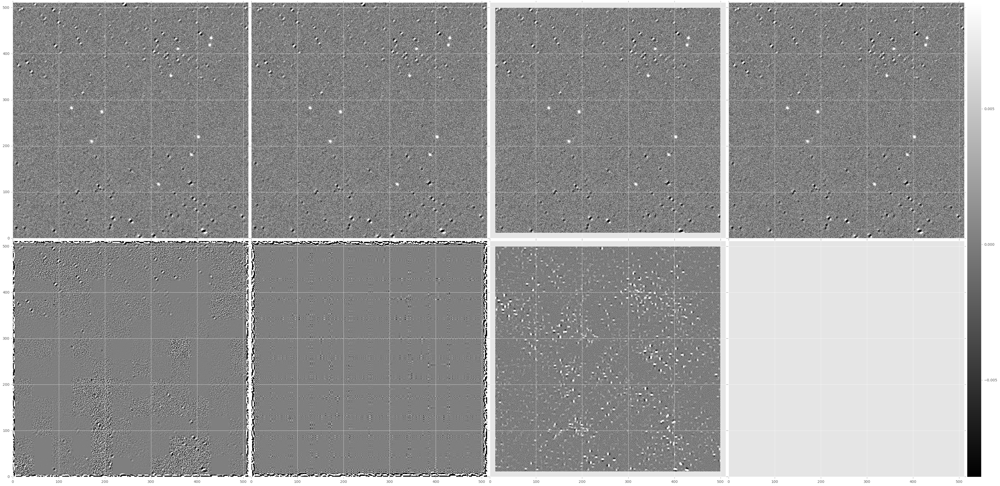

In [12]:
print dit.computeClippedImageStats(ga(exposure))
print dit.computeClippedImageStats(ga(newExp))
print dit.computeClippedImageStats(ga(newExpA))
print dit.computeClippedImageStats(ga(newExpB))
print dit.computeClippedImageStats(ga(exposure)-ga(newExp))
print dit.computeClippedImageStats(ga(newExp) - testObj.D_ZOGY.im)
print dit.computeClippedImageStats(ga(newExpA) - testObj.D_ZOGY.im)
print dit.computeClippedImageStats(ga(newExpB) - testObj.D_ZOGY.im)
dit.plotImageGrid((ga(newExp), ga(newExpA), ga(newExpB), testObj.D_ZOGY.im, ga(newExp)-testObj.D_ZOGY.im,
                  ga(newExpA)-testObj.D_ZOGY.im, ga(newExpB)-testObj.D_ZOGY.im), imScale=12)

Looks good, let's see what's going on on the edges...

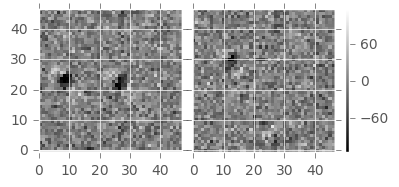

In [13]:
subexps = task._runMapper(exposure, template=template, sigmas=[sig1, sig2])
dit.plotImageGrid((subexps[0].subExposure, subexps[1].subExposure))

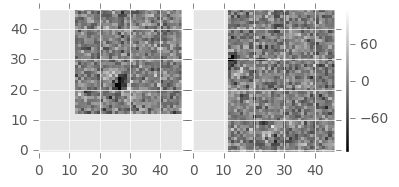

In [14]:
subexps = task._runMapper(exposure, template=template, sigmas=[sig1, sig2], inImageSpace=True)
dit.plotImageGrid((subexps[0].subExposure, subexps[1].subExposure))

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


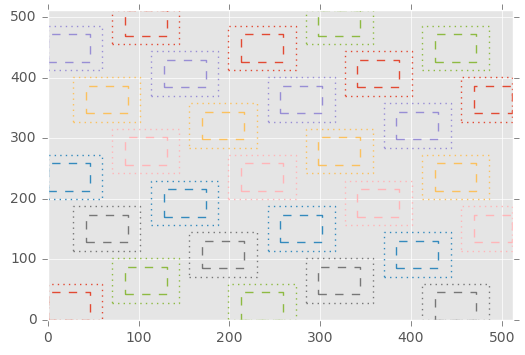

In [15]:
print task.config
task._plotBoxes(exposure, skip=5)

### try with *input* but variable psf.

In [16]:
newExp = task.run(exposure, template=template, variablePsf=testObj.variablePsf).exposure

stats(mean=5.4668827, stdev=20.938999, min=-82.0, max=2551.0)
stats(mean=0.018851962, stdev=24.935938, min=-472.7316, max=276.99234)
stats(mean=2.7257762, stdev=10.475032, min=-39.408722, max=2593.0413)
stats(mean=-0.038016873343078815, stdev=1.6544077727958226, min=-494.54689441876758, max=462.25891861474963)


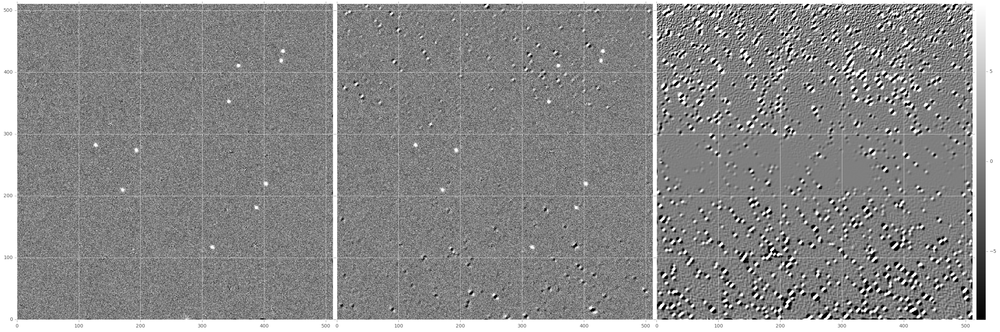

In [17]:
print dit.computeClippedImageStats(ga(exposure))
print dit.computeClippedImageStats(ga(newExp))
print dit.computeClippedImageStats(ga(exposure)-ga(newExp))
print dit.computeClippedImageStats(ga(newExp) - testObj.D_ZOGY.im)
dit.plotImageGrid((ga(newExp), testObj.D_ZOGY.im, ga(newExp)-testObj.D_ZOGY.im), imScale=12)

In [18]:
newExpB = task.run(exposure, template=template, inImageSpace=True, variablePsf=testObj.variablePsf).exposure

stats(mean=5.4668827, stdev=20.938999, min=-82.0, max=2551.0)
stats(mean=0.059808381, stdev=24.92655, min=-160.79738, max=276.98752)
stats(mean=2.7245681, stdev=10.437029, min=-39.407982, max=2593.0432)
stats(mean=-0.031873965811542525, stdev=1.5393111754666038, min=-339.41651749003705, max=462.22853359735461)
stats(mean=0.00023663476, stdev=0.004295676, min=-0.318573, max=0.36616802)


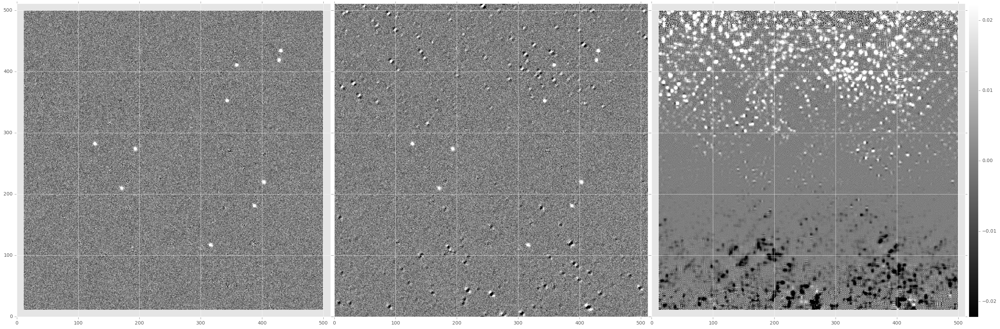

In [19]:
print dit.computeClippedImageStats(ga(exposure))
print dit.computeClippedImageStats(ga(newExpB))
print dit.computeClippedImageStats(ga(exposure)-ga(newExpB))
print dit.computeClippedImageStats(ga(newExpB) - testObj.D_ZOGY.im)
print dit.computeClippedImageStats(ga(newExpB) - ga(newExp))
dit.plotImageGrid((ga(newExpB), testObj.D_ZOGY.im, ga(newExpB)-ga(newExp)), imScale=12)

### re-do with measured psfs...

In [20]:
exposure2 = testObj.im2.asAfwExposure()
res = dit.tasks.doMeasurePsf(exposure2) #, psfMeasureConfig=config)
psf = res.psf
exposure2.setPsf(psf)

template2 = testObj.im1.asAfwExposure()
res = dit.tasks.doMeasurePsf(template2) #, psfMeasureConfig=config)
psf = res.psf
template2.setPsf(psf)

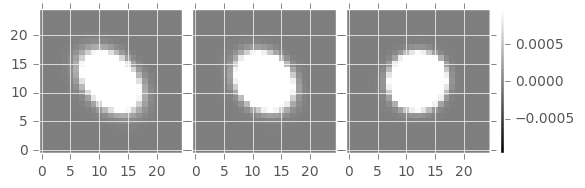

In [21]:
dit.plotImageGrid((testObj.variablePsf.getImage(40., 40.), 
                   testObj.variablePsf.getImage(250., 250.),
                   testObj.variablePsf.getImage(500., 500.)))

(41, 41)


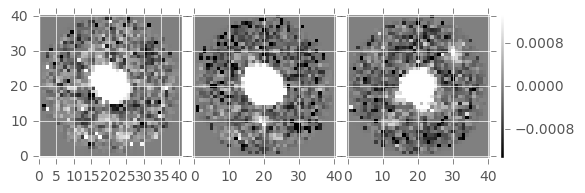

In [22]:
psf = exposure2.getPsf()
print psf.computeImage().getDimensions()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)), 
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))))

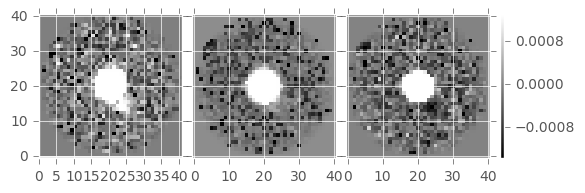

In [23]:
psf = template2.getPsf()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)),
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))))

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 5.0, 'borderSizeY': 5.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


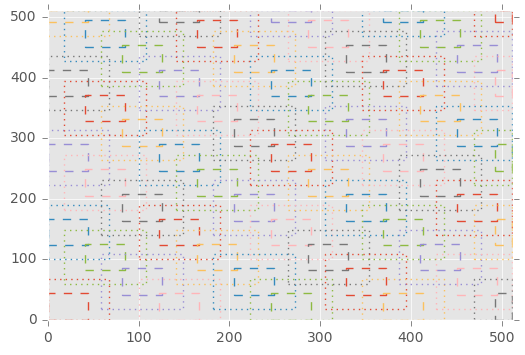

In [30]:
config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
#config.borderSizeX = config.borderSizeY = 7
config.reducerSubtask.reduceOperation = 'average'
task = ipDiffim.ImageMapReduceTask(config=config)
print config

newExp2 = task.run(exposure2, template=template2).exposure
task._plotBoxes(exposure2)

stats(mean=-0.53311741, stdev=20.938999, min=-88.0, max=2545.0)
stats(mean=0.018851962, stdev=24.935938, min=-472.7316, max=276.99234)
stats(mean=-1.0070249, stdev=25.262569, min=-327.41754, max=311.70148)
stats(mean=2.558934, stdev=29.888533, min=-207.60274, max=2529.0366)
stats(mean=-0.038016873343078815, stdev=1.6544077727958226, min=-494.54689441876758, max=462.25891861474963)
stats(mean=-1.1133785337982409, stdev=29.062652562798121, min=-336.92455092548528, max=449.73658662794605)
stats(mean=1.0498153, stdev=28.753368, min=-471.65875, max=326.10883)


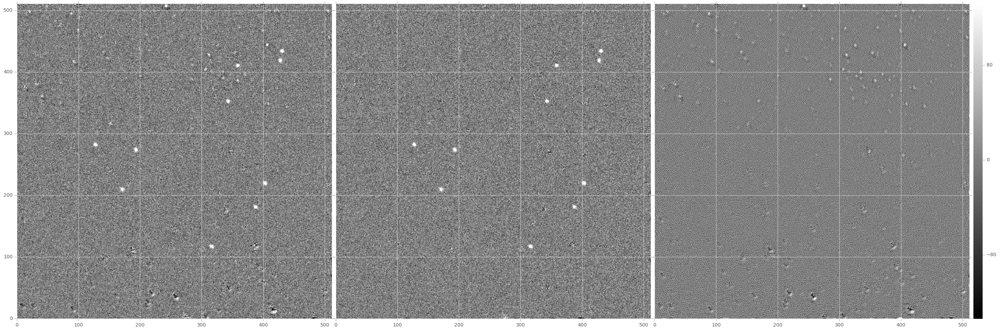

In [25]:
print dit.computeClippedImageStats(ga(exposure2))
print dit.computeClippedImageStats(ga(newExp))
print dit.computeClippedImageStats(ga(newExp2))
print dit.computeClippedImageStats(ga(exposure2)-ga(newExp2))
print dit.computeClippedImageStats(ga(newExp) - testObj.D_ZOGY.im)
print dit.computeClippedImageStats(ga(newExp2) - testObj.D_ZOGY.im)
print dit.computeClippedImageStats(ga(newExp) - ga(newExp2))
dit.plotImageGrid((ga(newExp2), ga(newExp), ga(newExp2) - ga(newExp)), #ga(newExp) - testObj.D_ZOGY.im), 
                  imScale=12)

Note when the PSF is spatially varying, this seems to work OK with `n_sources=1000` and thus more accurately measured PSFs, but with `n_sources=2000`, the result is not as nice!

Let's see what detection looks like on the new ZOGY diffim...

In [26]:
testObj2 = testObj.clone()
testObj2.D_ZOGY = dit.Exposure(ga(newExp2), testObj.D_ZOGY.psf, newExp2.getMaskedImage().getVariance().getArray())
testObj2.runTest()

{'ALstack': {'FN': 1, 'FP': 4, 'TP': 9},
 'ALstack_decorr': {'FN': 1, 'FP': 0, 'TP': 9},
 'SZOGY': {'FN': 1, 'FP': 2, 'TP': 9},
 'ZOGY': {'FN': 1, 'FP': 23, 'TP': 9}}

In [27]:
# for comparison:
testObj.runTest()

{'ALstack': {'FN': 1, 'FP': 4, 'TP': 9},
 'ALstack_decorr': {'FN': 1, 'FP': 0, 'TP': 9},
 'SZOGY': {'FN': 1, 'FP': 2, 'TP': 9},
 'ZOGY': {'FN': 1, 'FP': 45, 'TP': 9}}

In [28]:
# let's add the one where I used the *input* but variable PSF
testObj3 = testObj.clone()
testObj3.D_ZOGY = dit.Exposure(ga(newExp), testObj.D_ZOGY.psf, newExp.getMaskedImage().getVariance().getArray())
testObj3.runTest()

{'ALstack': {'FN': 1, 'FP': 4, 'TP': 9},
 'ALstack_decorr': {'FN': 1, 'FP': 0, 'TP': 9},
 'SZOGY': {'FN': 1, 'FP': 2, 'TP': 9},
 'ZOGY': {'FN': 1, 'FP': 1, 'TP': 9}}

In [29]:
# And the image-space version:
testObj2 = testObj.clone()
testObj2.D_ZOGY = dit.Exposure(ga(newExpB), testObj.D_ZOGY.psf, newExpB.getMaskedImage().getVariance().getArray())
testObj2.runTest()

{'ALstack': {'FN': 1, 'FP': 4, 'TP': 9},
 'ALstack_decorr': {'FN': 1, 'FP': 0, 'TP': 9},
 'SZOGY': {'FN': 1, 'FP': 2, 'TP': 9},
 'ZOGY': {'FN': 1, 'FP': 2, 'TP': 9}}